In [ ]:
def analyze_feature_groups(df, target_col='Machine failure'):
    """Analyze features by their logical groups"""
    
    # Define feature groups
    feature_groups = {
        'sensor_measurements': [
            'Air temperature', 'Process temperature', 
            'Rotational speed', 'Torque', 'Tool wear'
        ],
        'calculated_metrics': [
            'temperature_differential', 'power_speed_ratio',
            'thermal_stress', 'operational_stress', 
            'efficiency_index'
        ],
        'clustering_features': [
            'kmeans_cluster', 'ward_cluster', 'complete_cluster',
            'average_cluster', 'dbscan_cluster'
        ],
        'distance_metrics': [
            'kmeans_dist_0', 'kmeans_dist_1', 'kmeans_dist_2',
            'kmeans_dist_3', 'kmeans_dist_4', 'kmeans_dist_5'
        ],
        'interaction_terms': [col for col in df.columns if '_interaction' in col]
    }
    
    group_analysis = {}
    analyzer = ManufacturingDataAnalyzer(df, target_col)
    
    for group_name, features in feature_groups.items():
        # Get subset of data
        group_df = df[features + [target_col]]
        group_analyzer = ManufacturingDataAnalyzer(group_df, target_col)
        
        # Analyze each group
        group_analysis[group_name] = {
            'descriptive_stats': group_analyzer.descriptive_statistics(),
            'feature_importance': group_analyzer.feature_importance_analysis(),
            'group_comparisons': group_analyzer.group_comparison_analysis()
        }
    
    return group_analysis

In [ ]:
def analyze_feature_groups(selected_features, correlation_matrix, threshold=0.7):
    """
    Group analysis to remove redundancy while preserving information
    
    Justification:
    1. Correlation threshold 0.7: Strong relationship but not completely redundant
    2. Preserve features with highest MI within correlated groups
    """
    groups = []
    used_features = set()
    
    for feature in selected_features.index:
        if feature not in used_features:
            correlated = correlation_matrix[feature][
                correlation_matrix[feature].abs() > threshold].index.tolist()
            if correlated:
                group = pd.DataFrame({
                    'feature': correlated,
                    'mutual_info': [selected_features.get(f, 0) 
                                  for f in correlated]
                }).sort_values('mutual_info', ascending=False)
                groups.append(group)
                used_features.update(correlated)
    
    return groups

In [ ]:
def final_feature_selection(primary_features, feature_groups):
    """
    Final feature selection considering both statistical significance
    and practical importance
    """
    final_features = []
    reasoning = {}
    
    # Select best feature from each correlated group
    for group in feature_groups:
        best_feature = group.iloc[0]['feature']
        final_features.append(best_feature)
        
        reasoning[best_feature] = {
            'statistical_significance': primary_features.loc[best_feature, 'anova_p_value'],
            'predictive_power': primary_features.loc[best_feature, 'mutual_info'],
            'model_importance': primary_features.loc[best_feature, 'rf_importance'],
            'selection_reason': "Highest information content in its correlation group"
        }
    
    return final_features, reasoning

### Partioning Clustering, K-means algorithm

### Hierarchical clustering, Agglomerative

### Density-based clustering, DBSACN

Determining EPS and MinPts for DBSCAN algorithm

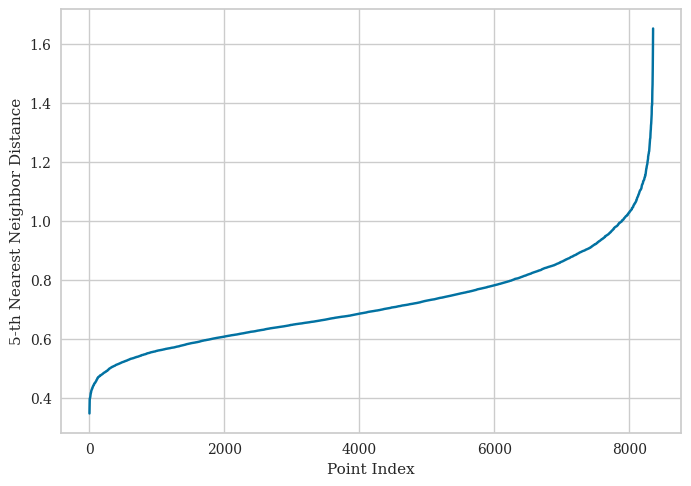

In [ ]:
from sklearn.neighbors import NearestNeighbors

k = 5

# create the nearest neighbors model
nn = NearestNeighbors(n_neighbors=k)
nn.fit(X)

# get the distances and indices of the kth nearest neighbors for each point
distances, indices = nn.kneighbors(X)

# get the kth nearest neighbor distances for each point
kth_distances = distances[:, k-1]

# sort the kth nearest neighbor distances
kth_distances_sorted = np.sort(kth_distances)

plt.plot(kth_distances_sorted)
plt.xlabel('Point Index')
plt.ylabel('5-th Nearest Neighbor Distance')
plt.show()

In [ ]:
from sklearn.cluster import DBSCAN

# create a DBSCAN model
model = DBSCAN(eps=1.2, min_samples=12)
model.fit(X)

# obtain the cluster labels
df['dbscan_cluster'] = model.labels_

Silhouette coefficient for density based clustering algorithm

In [ ]:
from sklearn.metrics import silhouette_score

# calculate the silhouette coefficient
score = silhouette_score(X, df["dbscan_cluster"])

print(f"Silhouette Coefficient: {score:.3f}")

Silhouette Coefficient: 0.183


<Figure size 1000x800 with 0 Axes>

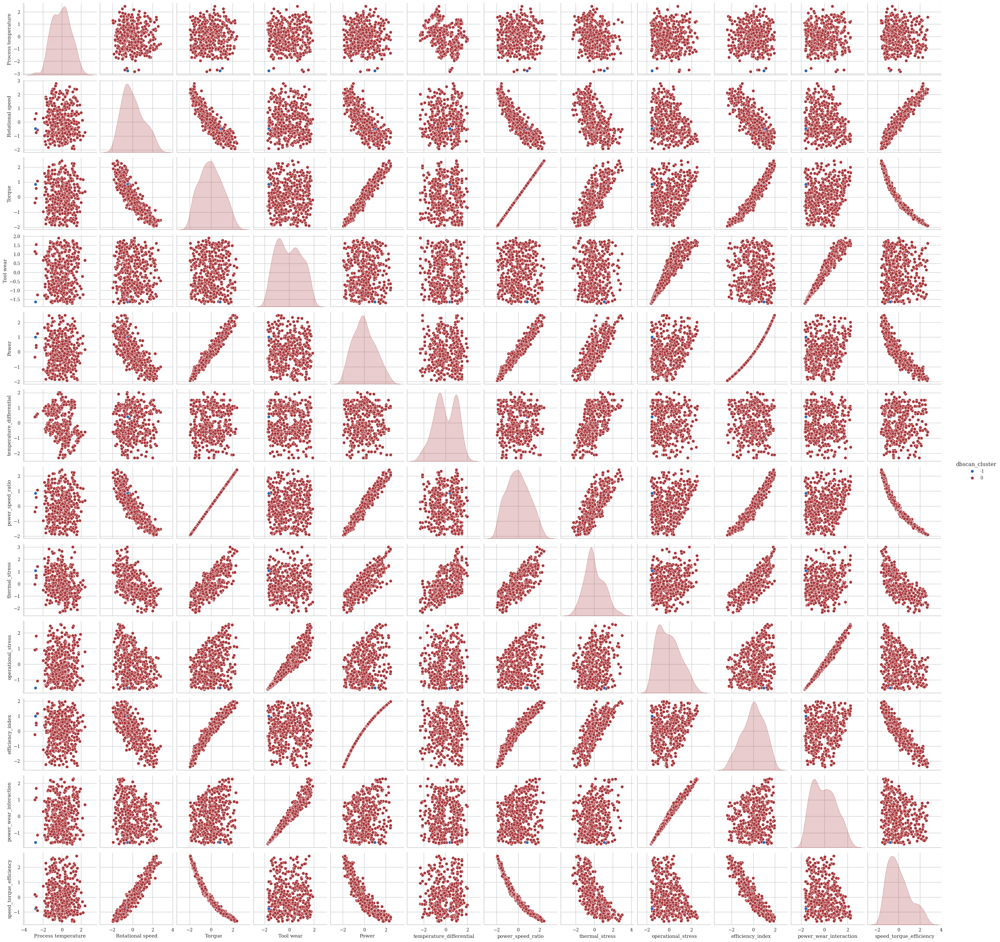

In [ ]:
plt.figure(figsize=(10, 8))

# create a pairplot of the data, colored by cluster label
sns.pairplot(df.sample(frac=0.05), hue="dbscan_cluster", palette="vlag", vars=["Process temperature", "Rotational speed", "Torque", "Tool wear", "Power","temperature_differential", "power_speed_ratio", "thermal_stress", "operational_stress", "efficiency_index", "power_wear_interaction", "speed_torque_efficiency"])
plt.show()

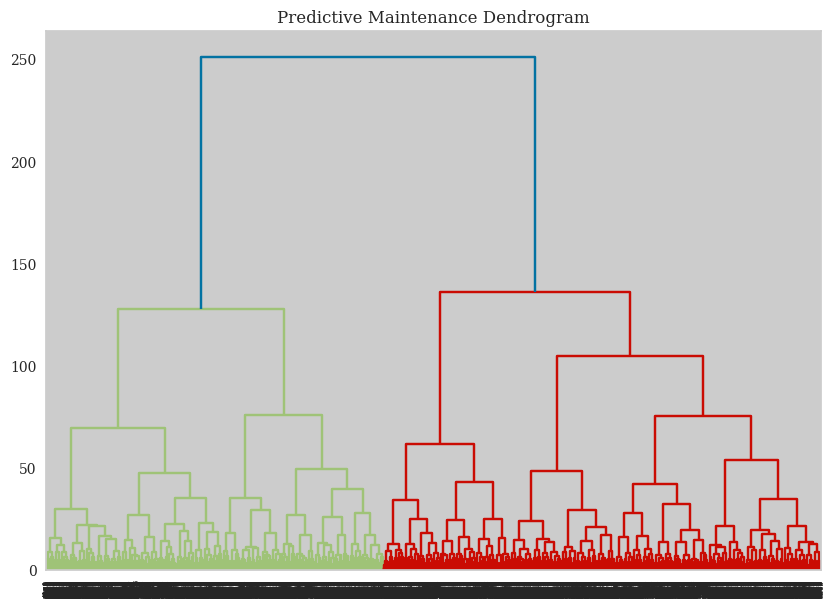

In [ ]:
import scipy.cluster.hierarchy as shc

# plot dendogram
plt.figure(figsize=(10, 7))
plt.title("Predictive Maintenance Dendrogram")

# Selecting Annual Income and Spending Scores by index
clusters = shc.linkage(X, method='ward', metric="euclidean")
# clusters = shc.linkage(X, method='complete', metric="euclidean")
# clusters = shc.linkage(X, method='average', metric="euclidean")

shc.dendrogram(Z=clusters)
plt.show()

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Hierarchical clustering
model = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
model.fit(X)
df["hierarchical_cluster"] = model.labels_


<Figure size 1000x800 with 0 Axes>

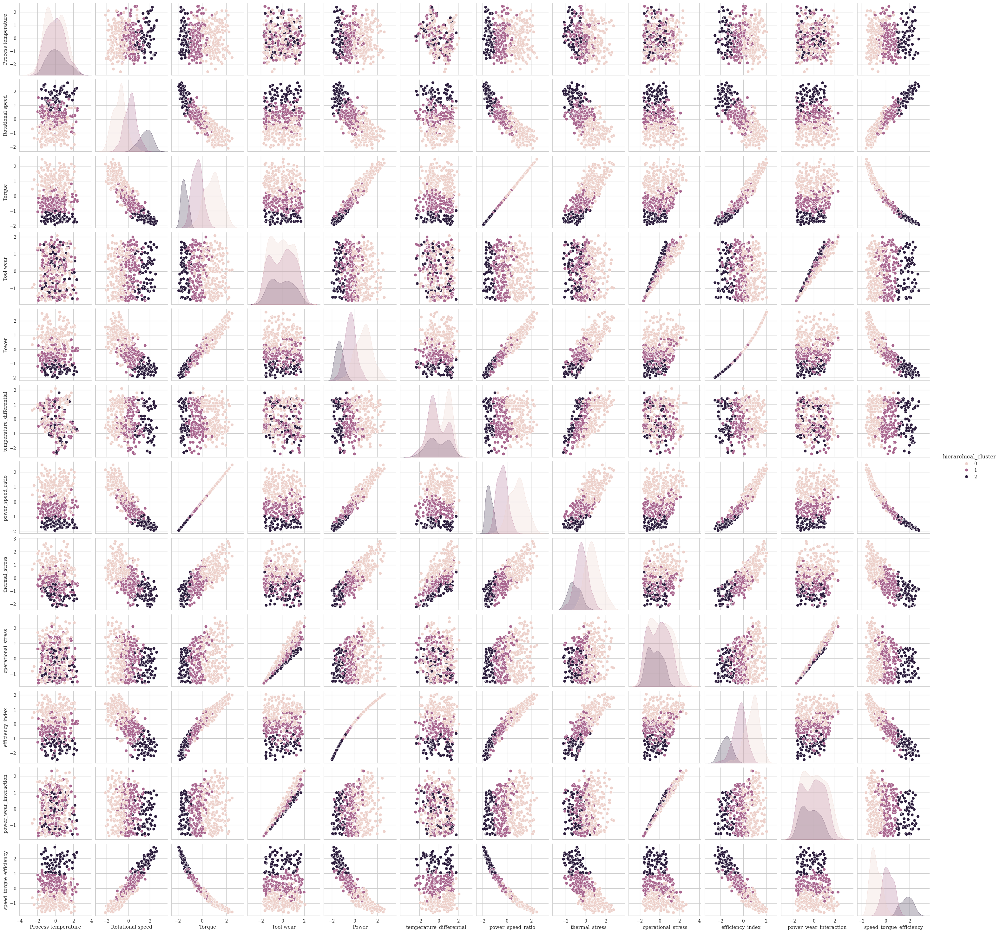

In [ ]:
plt.figure(figsize=(10, 8))

# create a pairplot of the data, colored by cluster label
sns.pairplot(df.sample(frac=0.05), hue="hierarchical_cluster", vars=[ "Process temperature", "Rotational speed", "Torque", "Tool wear", "Power","temperature_differential", "power_speed_ratio", "thermal_stress", "operational_stress", "efficiency_index", "power_wear_interaction", "speed_torque_efficiency"])
plt.show()

Silhouette coefficient for Agglomerative clustering algorithm

In [ ]:
from sklearn.metrics import silhouette_score

# calculate the silhouette coefficient
score = silhouette_score(X, df["hierarchical_cluster"])

print(f"Silhouette Coefficient: {score:.3f}")

Silhouette Coefficient: 0.168


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

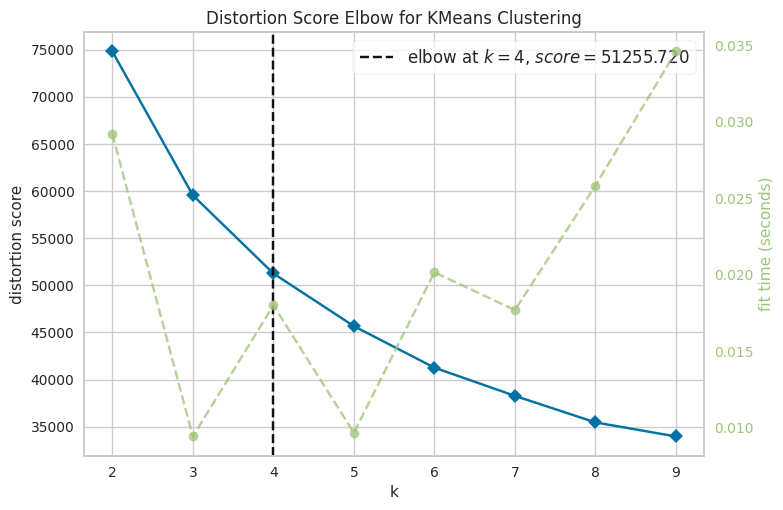

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

# K-means clustering
model = KMeans()

visualizer = KElbowVisualizer(model, k=(2,10)) # it turns out that k = 4 is the optimal number of clusters 

visualizer.fit(X)
visualizer.show()

In [ ]:
from sklearn.cluster import KMeans

# K-means clustering
kmeans = KMeans(init="random",  n_clusters=6,
                n_init=10, max_iter=300, random_state=42)
kmeans.fit(X)

df["kmeans_cluster"] = kmeans.predict(X)

Results

In [ ]:
plt.figure(figsize=(10, 8))

# create a pairplot of the data, colored by cluster label
sns.pairplot(df.sample(frac=0.05), hue="kmeans_cluster", vars=["Process temperature", "Rotational speed", "Torque", "Tool wear", "Power","temperature_differential", "power_speed_ratio", "thermal_stress", "operational_stress", "efficiency_index", "power_wear_interaction", "speed_torque_efficiency"])
plt.show()

KeyboardInterrupt: 

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

<Figure size 1000x800 with 0 Axes>

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

Silhouette coefficient for K-means algorithm

In [ ]:
from sklearn.metrics import silhouette_score

# calculate the silhouette coefficient
score = silhouette_score(X, kmeans.predict(X))

print(f"Silhouette Coefficient: {score:.3f}")

Silhouette Coefficient: 0.194
